In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

In [2]:
# model architecture
class AlexNet256(nn.Module):
    def __init__(self, num_classes):
        super(AlexNet256, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(64, 192, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((6, 6))
        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

In [3]:
# dataset object
class HistoDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        assert os.path.exists(root_dir), f"Root directory '{root_dir}' does not exist"
        
        self.classes = sorted(os.listdir(root_dir))
        print(f"Classes: {self.classes}")
        
        self.class_to_idx = {cls_name: i for i, cls_name in enumerate(self.classes)}
        print(f"Class-to-index mapping: {self.class_to_idx}")
        
        self.samples = []
        for target_class in self.classes:
            class_dir = os.path.join(root_dir, target_class)
            assert os.path.exists(class_dir), f"Class directory '{class_dir}' does not exist"
            
            for img_name in sorted(os.listdir(class_dir)):
                img_path = os.path.join(class_dir, img_name)
                assert os.path.isfile(img_path), f"Image file '{img_path}' does not exist"
                
                self.samples.append((img_path, self.class_to_idx[target_class]))
        
        print(f"Total samples: {len(self.samples)}")
        self.transform = transform

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, index):
        path, target = self.samples[index]
        assert os.path.isfile(path), f"Image file '{path}' does not exist"
        
        image = Image.open(path).convert('RGB')
        
        if self.transform is not None:
            image = self.transform(image)
        
        return image, target

# Define transforms
train_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

dev_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

test_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Create datasets and dataloaders
train_dataset = HistoDataset("D:/Nick/3D HnE/train set - Copy", transform=train_transforms)
train_eval_dataset = HistoDataset("D:/Nick/3D HnE/train set - Copy", transform=train_transforms)
dev_dataset = HistoDataset("D:/Nick/3D HnE/dev set - Copy", transform=dev_transforms)
test_dataset = HistoDataset("D:/Nick/3D HnE/test set - Copy", transform=test_transforms)

print('')
print(f"Train dataset size: {len(train_dataset)}")
print(f"Dev dataset size: {len(dev_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=0)
train_eval_loader = DataLoader(train_eval_dataset, batch_size=64, shuffle=True, num_workers=0)
dev_loader = DataLoader(dev_dataset, batch_size=64, shuffle=False, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=0)

print(f"Train dataloader size: {len(train_loader)}")
print(f"Dev dataloader size: {len(dev_loader)}")
print(f"Test dataloader size: {len(test_loader)}")

Classes: ['ileum', 'lung', 'spleen', 'tongue epithelium', 'tongue muscle']
Class-to-index mapping: {'ileum': 0, 'lung': 1, 'spleen': 2, 'tongue epithelium': 3, 'tongue muscle': 4}
Total samples: 9940
Classes: ['ileum', 'lung', 'spleen', 'tongue epithelium', 'tongue muscle']
Class-to-index mapping: {'ileum': 0, 'lung': 1, 'spleen': 2, 'tongue epithelium': 3, 'tongue muscle': 4}
Total samples: 9940
Classes: ['ileum', 'lung', 'spleen', 'tongue epithelium', 'tongue muscle']
Class-to-index mapping: {'ileum': 0, 'lung': 1, 'spleen': 2, 'tongue epithelium': 3, 'tongue muscle': 4}
Total samples: 50
Classes: ['ileum', 'lung', 'spleen', 'tongue epithelium', 'tongue muscle']
Class-to-index mapping: {'ileum': 0, 'lung': 1, 'spleen': 2, 'tongue epithelium': 3, 'tongue muscle': 4}
Total samples: 50

Train dataset size: 9940
Dev dataset size: 50
Test dataset size: 50
Train dataloader size: 156
Dev dataloader size: 1
Test dataloader size: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

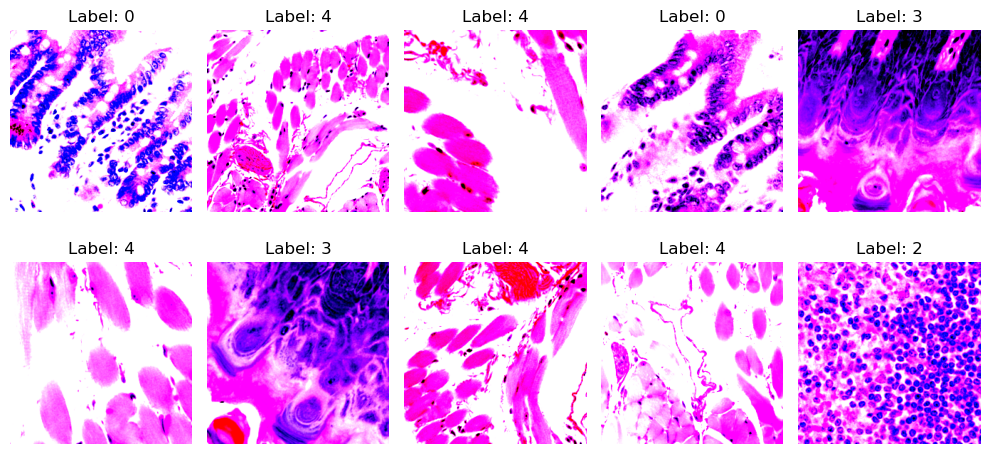

In [4]:
# show training dataset (random batch)
train_batch = next(iter(train_loader))
train_images, train_labels = train_batch

plt.figure(figsize=(10, 5))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(train_images[i].permute(1, 2, 0).numpy())
    plt.title(f"Label: {train_labels[i]}")
    plt.axis("off")
plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

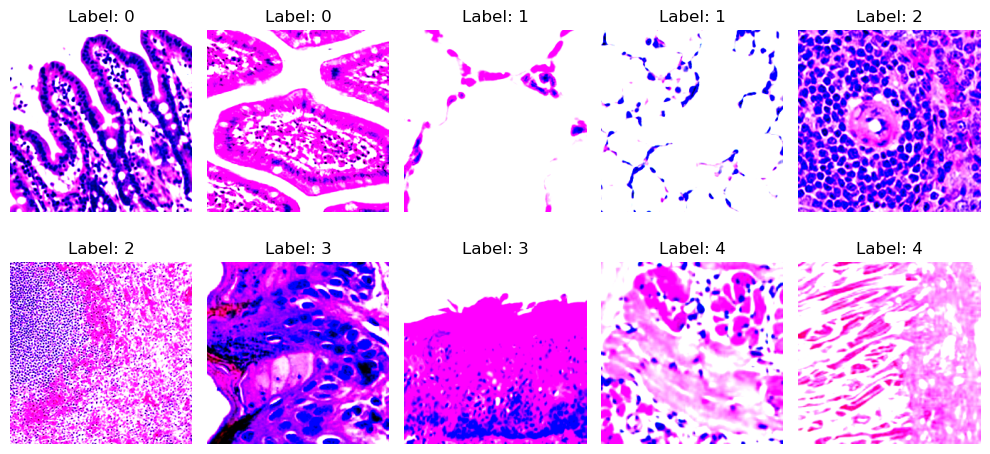

In [6]:
# show dev set
dev_batch = next(iter(dev_loader))
dev_images, dev_labels = dev_batch

plt.figure(figsize=(10, 5))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(dev_images[range(0, 50, 5)[i]].permute(1, 2, 0).numpy())
    plt.title(f"Label: {dev_labels[range(0, 50, 5)[i]]}")
    plt.axis("off")
plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

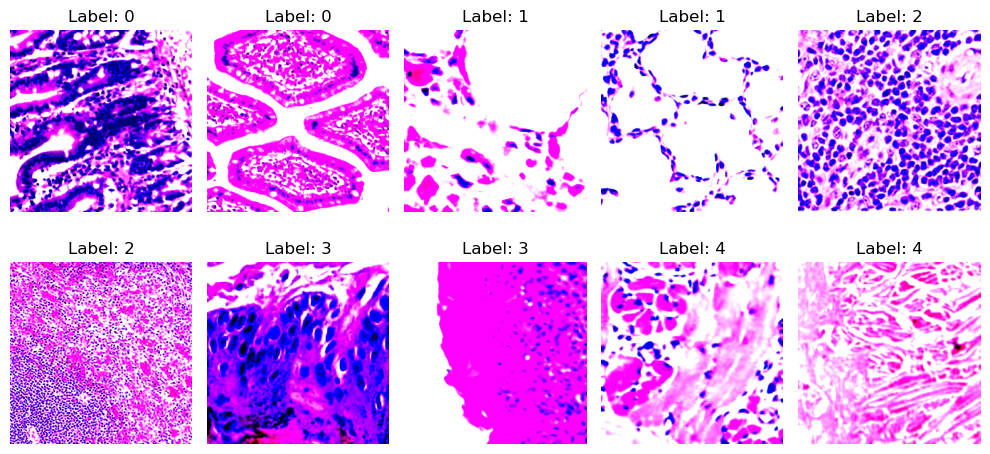

In [7]:
# show test set
test_batch = next(iter(test_loader))
test_images, test_labels = test_batch

plt.figure(figsize=(10, 5))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(test_images[range(0, 50, 5)[i]].permute(1, 2, 0).numpy())
    plt.title(f"Label: {test_labels[range(0, 50, 5)[i]]}")
    plt.axis("off")
plt.tight_layout()
plt.show()

In [4]:
# evaluate using train_eval set (different from train set to avoid consuming a batch) and dev set
def evaluate(model, criterion, train_eval_loader, dev_loader, device):
    model.eval()
    
    # Evaluate on a random batch of training eval set
    train_batch = next(iter(train_eval_loader))
    train_images, train_labels = train_batch[0].to(device), train_batch[1].to(device)
    with torch.no_grad():
        train_outputs = model(train_images)
        train_loss = criterion(train_outputs, train_labels)
        _, train_predicted = torch.max(train_outputs.data, 1)
        train_total = train_labels.size(0)
        train_correct = (train_predicted == train_labels).sum().item()
    train_accuracy = 100 * train_correct / train_total
    
    # Evaluate on a random batch of development set
    dev_batch = next(iter(dev_loader))
    dev_images, dev_labels = dev_batch[0].to(device), dev_batch[1].to(device)
    with torch.no_grad():
        dev_outputs = model(dev_images)
        dev_loss = criterion(dev_outputs, dev_labels)
        _, dev_predicted = torch.max(dev_outputs.data, 1)
        dev_total = dev_labels.size(0)
        dev_correct = (dev_predicted == dev_labels).sum().item()
    dev_accuracy = 100 * dev_correct / dev_total
    
    model.train()
    
    # Round loss to 3 decimal places and accuracy to 1 decimal place
    train_loss = round(train_loss.item(), 3)
    train_accuracy = round(train_accuracy, 1)
    dev_loss = round(dev_loss.item(), 3)
    dev_accuracy = round(dev_accuracy, 1)
    
    return train_loss, train_correct, train_total, train_accuracy, dev_loss, dev_correct, dev_total, dev_accuracy

In [27]:
# train the model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = AlexNet256(num_classes=5).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

# Evaluate the model before training
model.eval()
train_loss, train_correct, train_total, train_accuracy, dev_loss, dev_correct, dev_total, dev_accuracy = evaluate(model, criterion, train_eval_loader, dev_loader, device)
model.train()
print(f"Before training, Train Loss: {train_loss:.3f}, Dev Loss: {dev_loss:.3f}")
print(f"Train set: {train_correct} / {train_total}, Accuracy: {train_accuracy:.1f}%")
print(f"Dev set: {dev_correct} / {dev_total}, Accuracy: {dev_accuracy:.1f}%")
print()

num_epochs = 3
train_losses = []
dev_losses = []
train_accuracies = []
dev_accuracies = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for batch_idx, (images, labels) in enumerate(train_loader):
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        if (batch_idx + 1) % 10 == 0:
            train_losses.append(running_loss / 10)
            _, train_correct, train_total, train_accuracy, dev_loss, dev_correct, dev_total, dev_accuracy = evaluate(model, criterion, train_eval_loader, dev_loader, device)
            dev_losses.append(dev_loss)
            train_accuracies.append(train_accuracy)
            dev_accuracies.append(dev_accuracy)
            
            print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(train_loader)}], Train Loss: {running_loss / 10:.3f}, Dev Loss: {dev_loss:.3f}")
            print(f"Train set: {train_correct} / {train_total}, Accuracy: {train_accuracy:.1f}%")
            print(f"Dev set: {dev_correct} / {dev_total}, Accuracy: {dev_accuracy:.1f}%")
            print()
            running_loss = 0.0

print('Training finished!')
torch.save(model.state_dict(), 'trained_model.pth')

Before training, Train Loss: 1.609, Dev Loss: 1.610
Train set: 9 / 64, Accuracy: 14.1%
Dev set: 9 / 50, Accuracy: 18.0%

Epoch [1/3], Batch [10/156], Train Loss: 1.526, Dev Loss: 1.456
Train set: 30 / 64, Accuracy: 46.9%
Dev set: 16 / 50, Accuracy: 32.0%

Epoch [1/3], Batch [20/156], Train Loss: 1.106, Dev Loss: 1.969
Train set: 26 / 64, Accuracy: 40.6%
Dev set: 19 / 50, Accuracy: 38.0%

Epoch [1/3], Batch [30/156], Train Loss: 0.913, Dev Loss: 1.423
Train set: 36 / 64, Accuracy: 56.2%
Dev set: 26 / 50, Accuracy: 52.0%

Epoch [1/3], Batch [40/156], Train Loss: 0.719, Dev Loss: 1.524
Train set: 51 / 64, Accuracy: 79.7%
Dev set: 30 / 50, Accuracy: 60.0%

Epoch [1/3], Batch [50/156], Train Loss: 0.634, Dev Loss: 1.450
Train set: 57 / 64, Accuracy: 89.1%
Dev set: 32 / 50, Accuracy: 64.0%

Epoch [1/3], Batch [60/156], Train Loss: 0.554, Dev Loss: 1.052
Train set: 61 / 64, Accuracy: 95.3%
Dev set: 33 / 50, Accuracy: 66.0%

Epoch [1/3], Batch [70/156], Train Loss: 0.322, Dev Loss: 1.232
Train

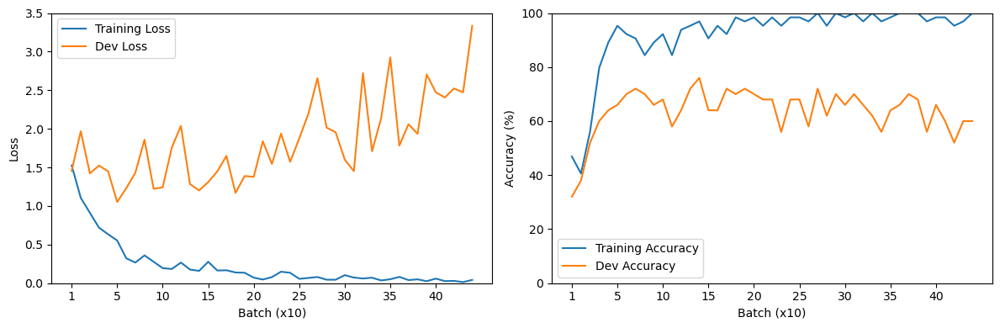

In [29]:
# plot running loss and accuracy to analyse overfitting (running loss and accuracy only available after training)
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(dev_losses, label='Dev Loss')
x_ticks = np.arange(0, len(train_losses), 5)
x_labels = [1] + [str(i * 5) for i in range(1, len(x_ticks))]
plt.xticks(x_ticks, x_labels)
plt.xlabel('Batch (x10)')
plt.ylabel('Loss')
plt.legend()
plt.ylim(bottom=0)

plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(dev_accuracies, label='Dev Accuracy')
x_ticks = np.arange(0, len(train_accuracies), 5)
x_labels = [1] + [str(i * 5) for i in range(1, len(x_ticks))]
plt.xticks(x_ticks, x_labels)
plt.xlabel('Batch (x10)')
plt.ylabel('Accuracy (%)')
plt.legend()
plt.ylim(bottom=0, top=100)

plt.tight_layout()
plt.show()

In [5]:
# new function, evaluate trained model and display correct and incorrect images 
def evaluate_and_display(model, data_loader, device):
    model.eval()
    model.to(device)
    
    batch = next(iter(data_loader))
    images, labels = batch
    images = images.to(device)
    labels = labels.to(device)
    
    with torch.no_grad():
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        
        correct_mask = (predicted == labels)
        correct_images = list(zip(images[correct_mask].cpu(), labels[correct_mask].cpu()))
        incorrect_images = list(zip(images[~correct_mask].cpu(), labels[~correct_mask].cpu(), predicted[~correct_mask].cpu()))
        
        accuracy = torch.sum(correct_mask).item() / labels.size(0) * 100
        
        incorrect_label_pairs = [(true.item(), pred.item()) for _, true, pred in incorrect_images]
    
    # Display accuracy
    print(f"Correct: {torch.sum(correct_mask).item()} / {labels.size(0)}, Accuracy: {accuracy:.1f}%")
    
    # Display incorrect label pairs
    print(f"Incorrect label pairs (true label, predicted label): {incorrect_label_pairs}")
    
    # Count incorrectly classified images for each class
    class_names = ['ileum', 'lung', 'spleen', 'tongue epithelium', 'tongue muscle']
    incorrect_counts = [0] * 5
    for _, true_label, _ in incorrect_images:
        incorrect_counts[true_label] += 1
    
    incorrect_class_counts = ", ".join([f"{class_name} ({count})" for class_name, count in zip(class_names, incorrect_counts)])
    print(f"Incorrectly classified: {incorrect_class_counts}")
    
    # Count images incorrectly classified as each class
    incorrect_pred_counts = [0] * 5
    for _, _, pred_label in incorrect_images:
        incorrect_pred_counts[pred_label] += 1
    
    incorrect_pred_class_counts = ", ".join([f"{class_name} ({count})" for class_name, count in zip(class_names, incorrect_pred_counts)])
    print(f"Incorrectly classified as: {incorrect_pred_class_counts}")
    
    # Reverse normalization for display
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])
    
    def unnormalize(image):
        return image * std[:, None, None] + mean[:, None, None]
    
    # Display correctly classified images
    num_correct = len(correct_images)
    num_rows = (num_correct + 9) // 10
    fig, axes = plt.subplots(num_rows, 10, figsize=(20, 2 * num_rows))
    axes = axes.flatten()
    for i, (image, label) in enumerate(correct_images):
        unnormalized_image = unnormalize(image)
        axes[i].imshow(unnormalized_image.permute(1, 2, 0))
        axes[i].set_title(f"True: {label}")
        axes[i].axis('off')
    for i in range(num_correct, len(axes)):
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()
    
    # Display incorrectly classified images
    num_incorrect = len(incorrect_images)
    num_rows = (num_incorrect + 9) // 10
    fig, axes = plt.subplots(num_rows, 10, figsize=(20, 2 * num_rows))
    axes = axes.flatten()
    for i, (image, true_label, pred_label) in enumerate(incorrect_images):
        unnormalized_image = unnormalize(image)
        axes[i].imshow(unnormalized_image.permute(1, 2, 0))
        axes[i].set_title(f"True: {true_label}, Pred: {pred_label}")
        axes[i].axis('off')
    for i in range(num_incorrect, len(axes)):
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

Evaluating on the train dataset:
Correct: 62 / 64, Accuracy: 96.9%
Incorrect label pairs (true label, predicted label): [(2, 0), (1, 4)]
Incorrectly classified: ileum (0), lung (1), spleen (1), tongue epithelium (0), tongue muscle (0)
Incorrectly classified as: ileum (1), lung (0), spleen (0), tongue epithelium (0), tongue muscle (1)


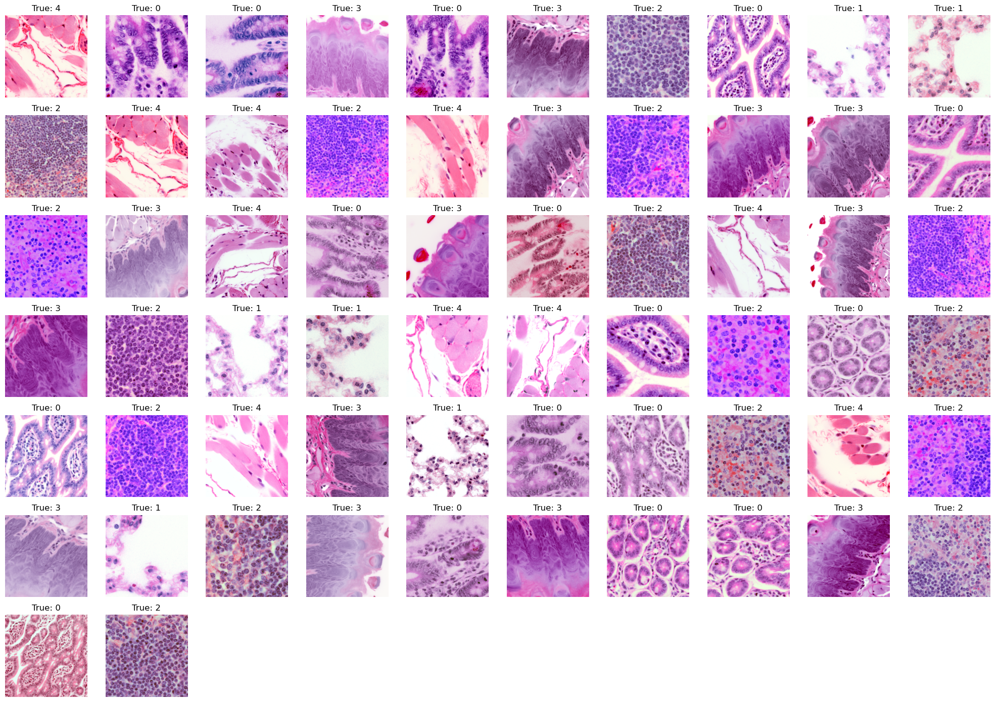

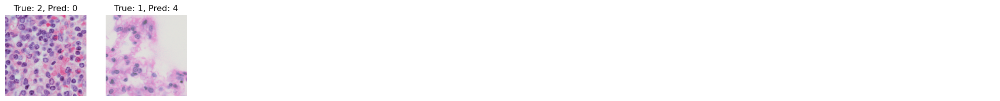

In [19]:
# load and evaluate trained model
model = AlexNet256(num_classes=5)
model.load_state_dict(torch.load('trained_model.pth'))
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Evaluating on the train dataset:")
evaluate_and_display(model, train_eval_loader, device)

Evaluating on the dev dataset:
Correct: 28 / 50, Accuracy: 56.0%
Incorrect label pairs (true label, predicted label): [(0, 1), (0, 4), (0, 4), (0, 3), (0, 3), (0, 4), (0, 4), (1, 4), (1, 0), (2, 0), (2, 0), (2, 0), (3, 0), (3, 0), (3, 4), (3, 4), (4, 0), (4, 0), (4, 0), (4, 0), (4, 3), (4, 3)]
Incorrectly classified: ileum (7), lung (2), spleen (3), tongue epithelium (4), tongue muscle (6)
Incorrectly classified as: ileum (10), lung (1), spleen (0), tongue epithelium (4), tongue muscle (7)


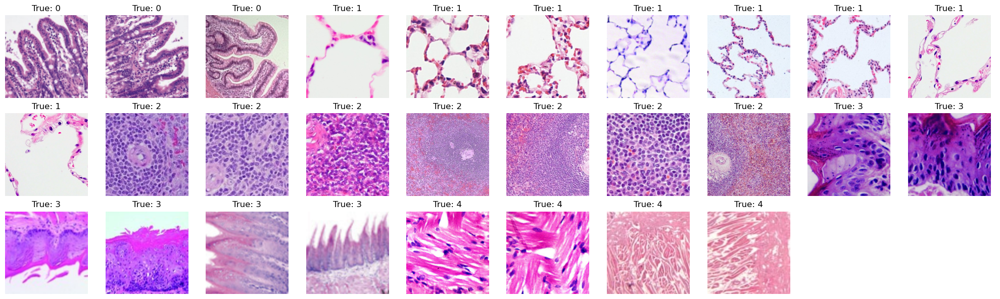

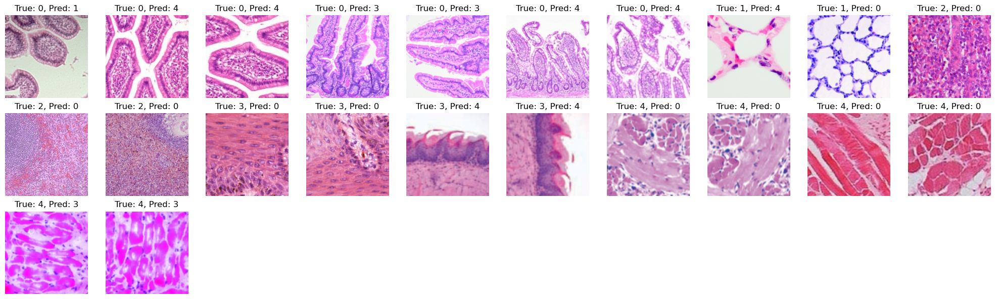

In [8]:
# Evaluate on the dev dataset
print("Evaluating on the dev dataset:")
evaluate_and_display(model, dev_loader, device)

Evaluating on the test dataset:
Correct: 31 / 50, Accuracy: 62.0%
Incorrect label pairs (true label, predicted label): [(0, 2), (0, 4), (0, 4), (0, 3), (0, 2), (0, 4), (0, 4), (1, 4), (2, 0), (2, 0), (2, 0), (3, 4), (3, 0), (3, 4), (3, 4), (4, 0), (4, 0), (4, 3), (4, 3)]
Incorrectly classified: ileum (7), lung (1), spleen (3), tongue epithelium (4), tongue muscle (4)
Incorrectly classified as: ileum (6), lung (0), spleen (2), tongue epithelium (3), tongue muscle (8)


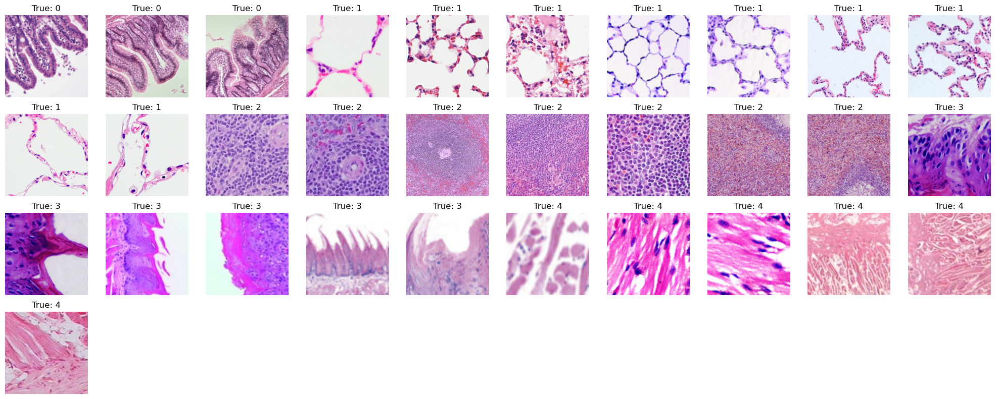

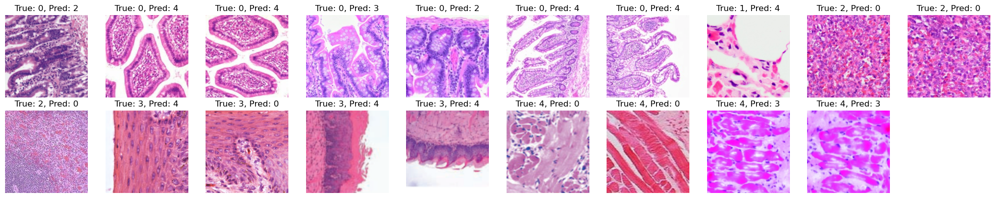

In [9]:
# Evaluate on the test dataset
print("Evaluating on the test dataset:")
evaluate_and_display(model, test_loader, device)

In [15]:
print(torch.cuda.is_available())

False
